In [105]:
import os
import cv2
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from pathlib import Path

In [106]:
def compute_color_histogram(image, bin_size= 8):
    hist = cv2.calcHist([image], [0, 1, 2], None, [bin_size]*3, [0, 256]*3)
    hist = cv2.normalize(hist, hist).flatten()
    return hist

In [107]:
def show_image(image, title, figsize= (10, 10)):
    plt.figure(figsize=figsize)
    plt.title(title)
    plt.imshow(image)
    plt.axis("off")
    plt.show()

In [108]:
def rgb(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [109]:
dataset_dir = "./panorama_dataset"
clusters_dir = "clustered_images"
num_clusters = 3

image_paths = []
for image_path in os.listdir(dataset_dir):
    image_path = os.path.join(dataset_dir, image_path)
    image_paths.append(image_path)

features = []
for image_path in image_paths:
    image = cv2.imread(image_path)
    image_feature = compute_color_histogram(image)
    features.append(image_feature)

kmeans = KMeans(n_clusters=num_clusters, random_state=2022028)
labels = kmeans.fit_predict(features)
Path(clusters_dir).mkdir(exist_ok=True)

for i in range(num_clusters):
    cluster_i = os.path.join(clusters_dir, f"cluster_{i}")
    os.makedirs(cluster_i, exist_ok=True)
    for image_path, label in zip(image_paths, labels):
        if label == i:
            clustered_image_path = os.path.join(cluster_i, image_path.split('\\')[-1])
            cv2.imwrite(clustered_image_path, cv2.imread(image_path))

print(f"Images saved into '{clusters_dir}'.")


Images saved into 'clustered_images'.


In [110]:
def get_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)

    print(f"Number of keypoints detected: {len(keypoints)}")
    print(f"Descriptor shape: {descriptors.shape}")
    return keypoints, descriptors

def visualize_features(image, keypoints):
    image_with_keypoints = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)   
    show_image(rgb(image_with_keypoints), "SIFT Keypoints")

Number of keypoints detected: 5890
Descriptor shape: (5890, 128)


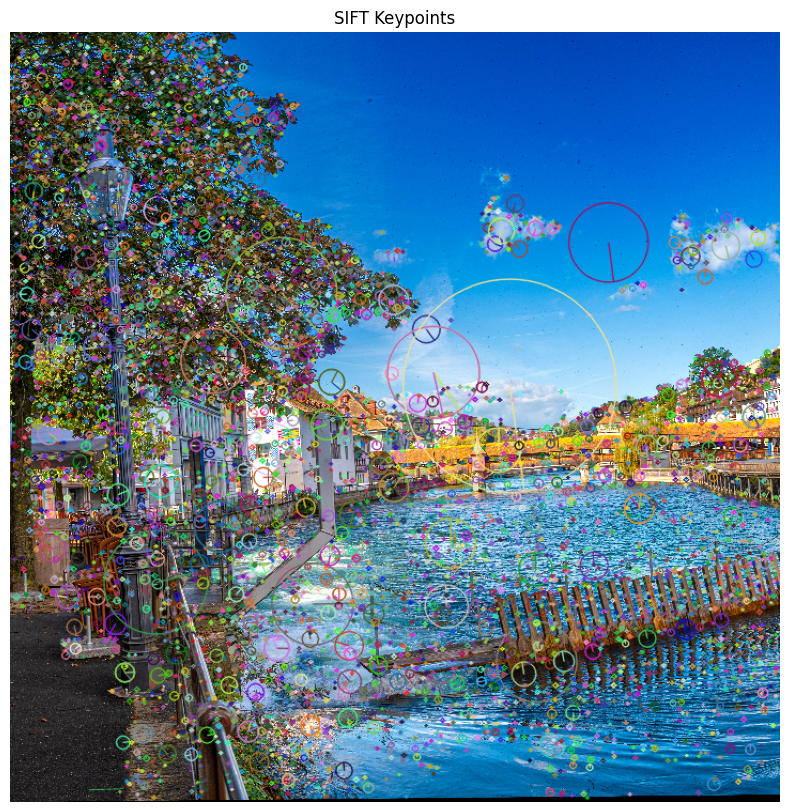

Number of keypoints detected: 4510
Descriptor shape: (4510, 128)


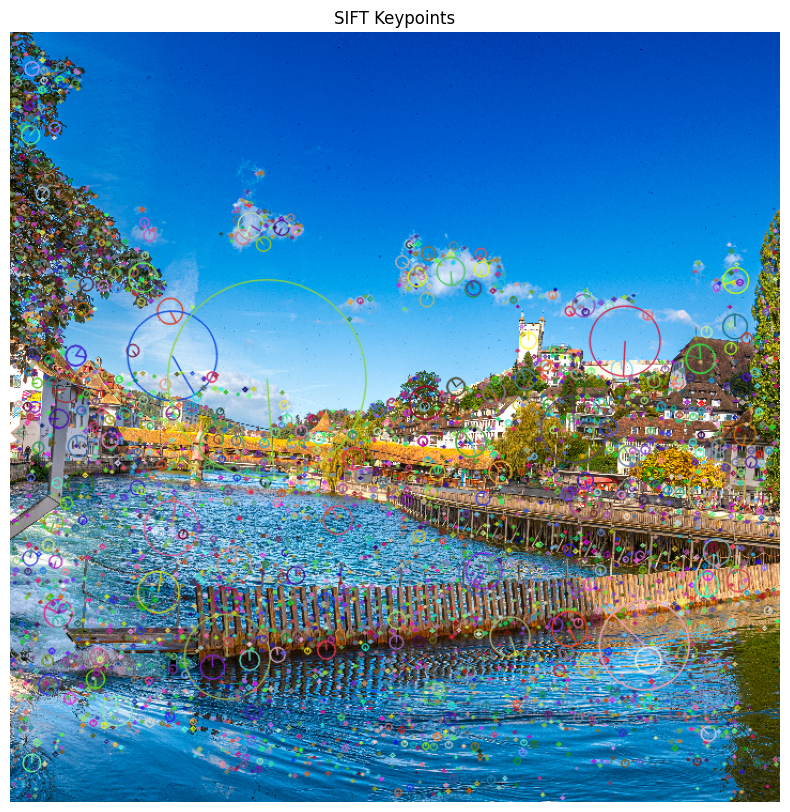

In [111]:
image1 = cv2.imread(os.path.join(dataset_dir, 'image1.png'))
image2 = cv2.imread(os.path.join(dataset_dir, 'image2.png'))
keypoints_1, descriptors_1 = get_features(image1)
visualize_features(image1, keypoints_1)
keypoints_2, descriptors_2 = get_features(image2)
visualize_features(image2, keypoints_2)

In [112]:
# --- Lowe's Ratio Test ---
def ratio_test(matches, t=0.75):
    good_matches = []
    for m, n in matches:
        if m.distance < t * n.distance:
            good_matches.append(m)
    return good_matches


In [113]:
def draw_matches(image1, keypoints_1, image2, keypoints_2, matches, title):
    matched_image = cv2.drawMatches(image1, keypoints_1, image2, keypoints_2, matches, None, 
                                    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        
    show_image(rgb(matched_image), title, figsize=(15,8))

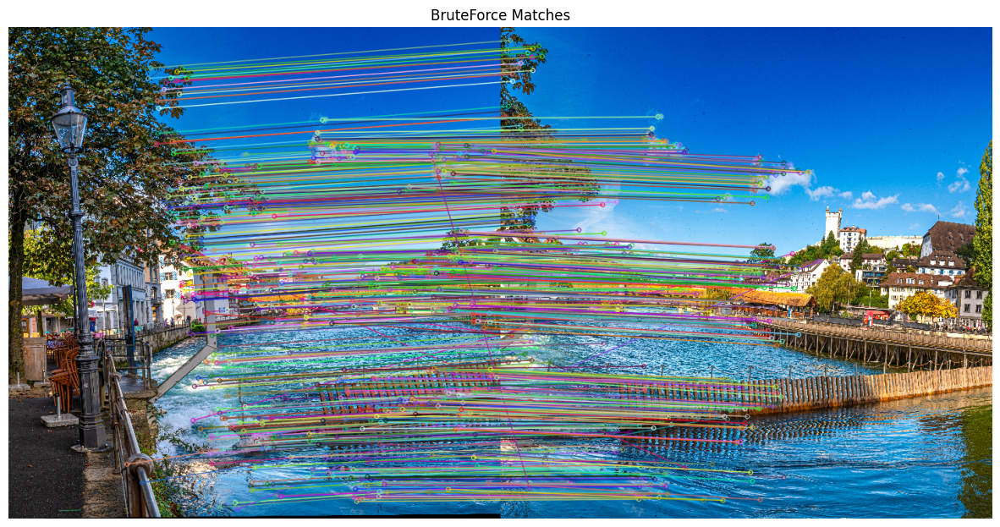

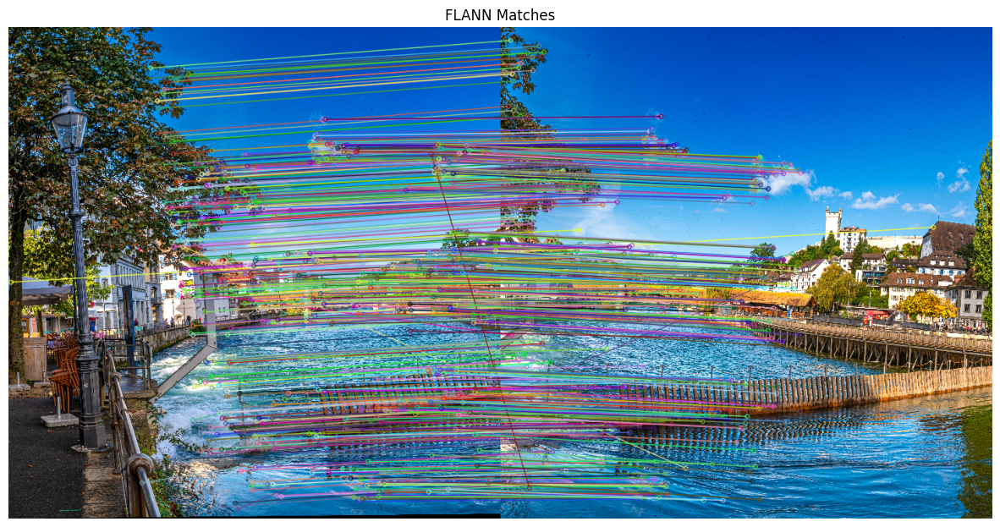

In [114]:
bf = cv2.BFMatcher()
matches_bf = bf.knnMatch(descriptors_1, descriptors_2, k=2)
good_bf = ratio_test(matches_bf)

FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches_flann = flann.knnMatch(descriptors_1, descriptors_2, k=2)
good_flann = ratio_test(matches_flann, t=0.7)

draw_matches(image1, keypoints_1, image2, keypoints_2, good_bf, "BruteForce Matches")
draw_matches(image1, keypoints_1, image2, keypoints_2, good_flann, "FLANN Matches")

In [ ]:
src_pts = np.float32([keypoints_1[m.queryIdx].pt for m in good_flann]).reshape(-1, 1, 2)
dst_pts = np.float32([keypoints_2[m.trainIdx].pt for m in good_flann]).reshape(-1, 1, 2)
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 3.0)
pd.DataFrame(M).to_csv("homography.csv", index=False, header=False)

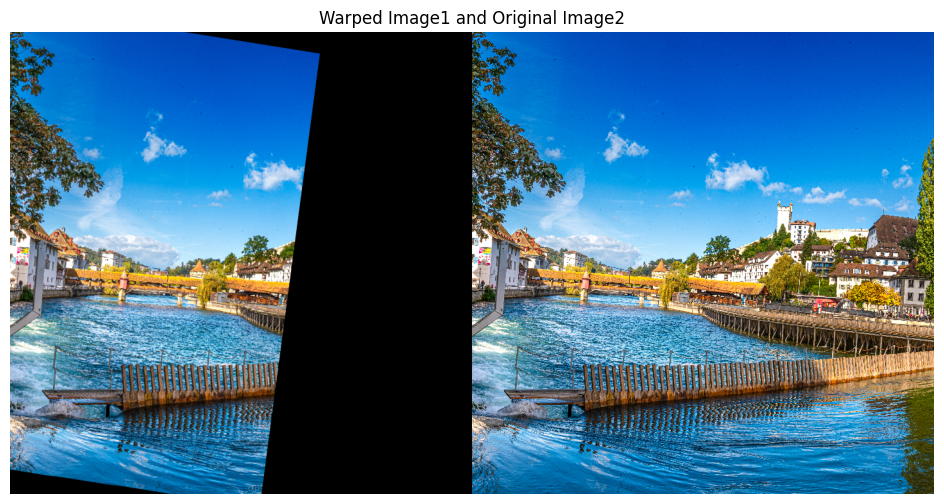

In [117]:
h1, w1 = image1.shape[:2]
h2, w2 = image2.shape[:2]

warped_img1 = cv2.warpPerspective(image1, M, (w2, h2))
combined_image = rgb(np.hstack((warped_img1, image2)))
show_image(combined_image, 'Warped Image1 and Original Image2', figsize=(12, 6))

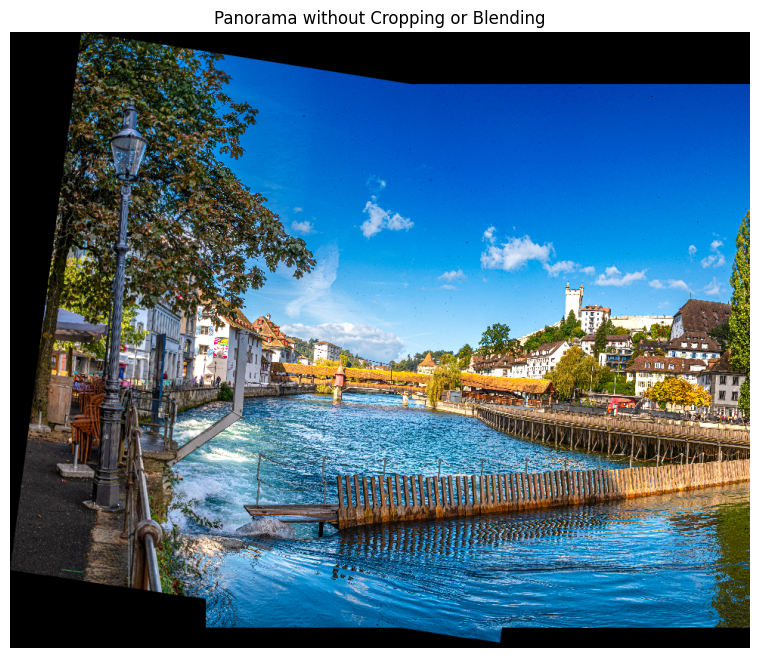

In [118]:
# Get the corners of img1
corners_img1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)

# Warp the corners to see where they map in img2's space
warped_corners = cv2.perspectiveTransform(corners_img1, M)

# Combine with corners of img2 to get total panorama size
all_corners = np.concatenate((warped_corners, np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)), axis=0)

# Find bounding box of all corners
[x_min, y_min] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
[x_max, y_max] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

translation = [-x_min, -y_min]
translate_matrix = np.array([[1, 0, translation[0]],
                             [0, 1, translation[1]],
                             [0, 0, 1]])

# Step 2: Warp img1 to new canvas
result = cv2.warpPerspective(image1, translate_matrix @ M, (x_max - x_min, y_max - y_min))
# Place img2 on the canvas
result[translation[1]:translation[1] + h2, translation[0]:translation[0] + w2] = image2

# Show panorama without cropping or blending
plt.figure(figsize=(16, 8))
plt.title("Panorama without Cropping or Blending")
plt.imshow(rgb(result))
plt.axis('off')
plt.show()

# Step 3: Crop the result using a mask
gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
x, y, w, h = cv2.boundingRect(contours[0])
cropped = result[y:y+h, x:x+w]
